# ResQVision - Data Analysis

---

## Imports


In [1]:
import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from PIL import Image
import cv2
from tqdm.auto import tqdm
from collections import defaultdict
import warnings

warnings.filterwarnings('ignore')
sns.set_theme(style="whitegrid")

## Configuration


In [2]:
BASE_DIR = Path.cwd().parent
DATA_DIR = BASE_DIR / 'data'
PROCESSED_TRAIN_DIR = DATA_DIR / 'processed' / 'train'
ANALYSIS_DIR = DATA_DIR / 'analysis'

PLOTS_DIR = ANALYSIS_DIR / 'plots'
SAMPLES_DIR = ANALYSIS_DIR / 'samples'

for d in [PLOTS_DIR, SAMPLES_DIR]:
    d.mkdir(parents=True, exist_ok=True)

CLASS_MAPPING = {
    0: 'no-damage',
    1: 'minor-damage',
    2: 'major-damage',
    3: 'destroyed',
    4: 'un-classified'
}

## Data Loading & Validation

In [3]:
def load_and_validate_data(target_dir: Path) -> pd.DataFrame:
    data = []
    
    for disaster_dir in [d for d in target_dir.iterdir() if d.is_dir()]:
        disaster_type = disaster_dir.name
        
        for sample_dir in [s for s in disaster_dir.iterdir() if s.is_dir()]:
            sample_id = sample_dir.name
            
            pre_path = sample_dir / 'pre.png'
            post_path = sample_dir / 'post.png'
            target_path = sample_dir / 'target.png'
            label_path = sample_dir / 'label.json'
            
            missing = []
            if not pre_path.exists(): missing.append('pre.png')
            if not post_path.exists(): missing.append('post.png')
            if not target_path.exists(): missing.append('target.png')
            if not label_path.exists(): missing.append('label.json')
            
            data.append({
                'disaster_type': disaster_type,
                'sample_id': sample_id,
                'sample_dir': str(sample_dir),
                'pre_path': str(pre_path),
                'post_path': str(post_path),
                'target_path': str(target_path),
                'label_path': str(label_path),
                'is_valid': len(missing) == 0,
                'missing_files': ", ".join(missing)
            })
            
    return pd.DataFrame(data)

df_full = load_and_validate_data(PROCESSED_TRAIN_DIR)
df_valid = df_full[df_full['is_valid']].copy()
df_invalid = df_full[~df_full['is_valid']].copy()

print(f"Total samples found: {len(df_full)}")
print(f"Valid samples: {len(df_valid)}")
print(f"Invalid/Missing files samples: {len(df_invalid)}")

if not df_invalid.empty:
    invalid_report_path = ANALYSIS_DIR / 'invalid_samples_report.csv'
    df_invalid.to_csv(invalid_report_path, index=False)
    print(f"Saved invalid samples report to {invalid_report_path}")

Total samples found: 2799
Valid samples: 2799
Invalid/Missing files samples: 0


## Dataset Stats & Distribution

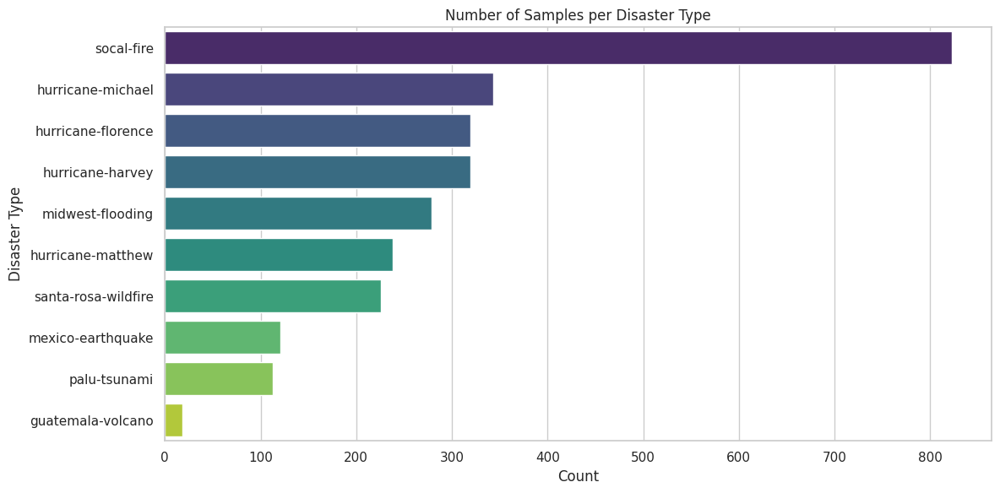

Saved disaster distribution plot to /home/prosper/Desktop/Python/Projects/Project_019_ResQVision/service/data/analysis/plots/disaster_distribution.png


In [4]:
def analyze_dataset_stats(df: pd.DataFrame):
    dist_counts = df['disaster_type'].value_counts()
    
    plt.figure(figsize=(12, 6))
    sns.barplot(x=dist_counts.values, y=dist_counts.index, palette='viridis')
    plt.title('Number of Samples per Disaster Type')
    plt.xlabel('Count')
    plt.ylabel('Disaster Type')
    plt.tight_layout()
    plot_path = PLOTS_DIR / 'disaster_distribution.png'
    plt.savefig(plot_path, dpi=300)
    plt.show()
    print(f"Saved disaster distribution plot to {plot_path}")
    
analyze_dataset_stats(df_valid)

## Mask, Image & Label Deep Analysis

In [5]:
def deep_analysis(df: pd.DataFrame, sample_size: int = 1000):
    if len(df) > sample_size:
        print(f"Sampling {sample_size} random pairs for deep analysis...")
        df_sample = df.sample(n=sample_size, random_state=42)
    else:
        df_sample = df

    mask_class_counts = {k: 0 for k in range(5)}
    resolutions = []
    intensities_pre = []
    intensities_post = []
    
    buildings_per_image = []
    damage_cat_counts = {k: 0 for k in range(5)}
    
    building_metrics = []
    
    for _, row in tqdm(df_sample.iterrows(), total=len(df_sample), desc="Analyzing Data"):
        try:
            target = np.array(Image.open(row['target_path']))
            vals, counts = np.unique(target, return_counts=True)
            for val, count in zip(vals, counts):
                if val in mask_class_counts:
                    mask_class_counts[val] += count
                    
            pre_img = np.array(Image.open(row['pre_path']))
            post_img = np.array(Image.open(row['post_path']))
            
            resolutions.append(pre_img.shape[:2])
            intensities_pre.append(pre_img.mean())
            intensities_post.append(post_img.mean())
            
            valid_mask = (target > 0).astype(np.uint8)
            num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(valid_mask, connectivity=8)
            buildings_per_image.append(num_labels - 1)
            
            if num_labels > 1:
                for i in range(1, num_labels):
                    area = stats[i, cv2.CC_STAT_AREA]
                    comp_mask = (labels == i)
                    cls_vals, cls_cnts = np.unique(target[comp_mask], return_counts=True)
                    if len(cls_vals) > 0:
                        dom_cls = cls_vals[np.argmax(cls_cnts)]
                        damage_cat_counts[dom_cls] = damage_cat_counts.get(dom_cls, 0) + 1
                        
                        pre_gray = cv2.cvtColor(pre_img, cv2.COLOR_RGB2GRAY) if pre_img.ndim == 3 else pre_img
                        mean_int = pre_gray[comp_mask].mean()
                        
                        building_metrics.append({
                            'damage_class': dom_cls,
                            'area': area,
                            'pre_intensity': mean_int
                        })
                        
        except Exception as e:
            print(f"Error processing sample {row['sample_id']}: {e}")
            
    df_metrics = pd.DataFrame(building_metrics)
    return mask_class_counts, resolutions, intensities_pre, intensities_post, buildings_per_image, df_metrics

mask_counts, resolutions, intensities_pre, intensities_post, buildings_counts, df_metrics = deep_analysis(df_valid, sample_size=1000)

Sampling 1000 random pairs for deep analysis...


Analyzing Data:   0%|          | 0/1000 [00:00<?, ?it/s]

## Saving and Plotting Analysis Results

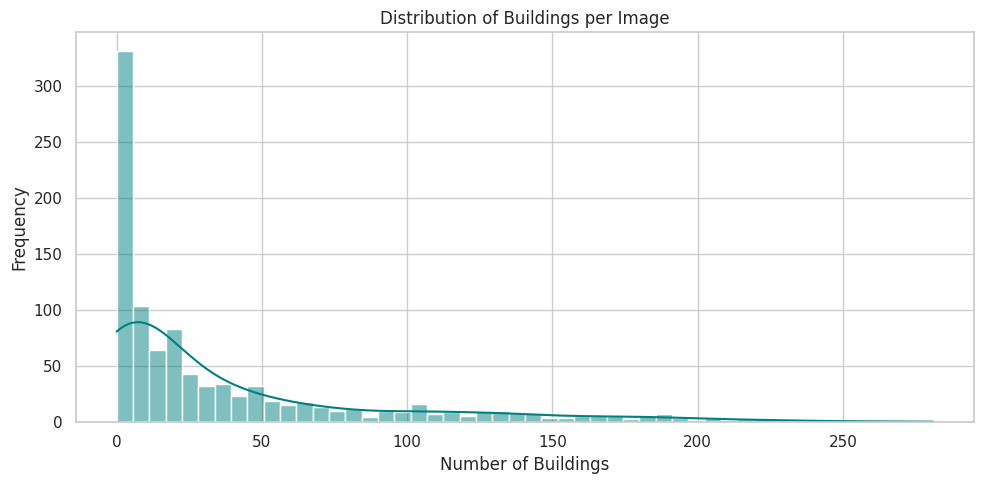

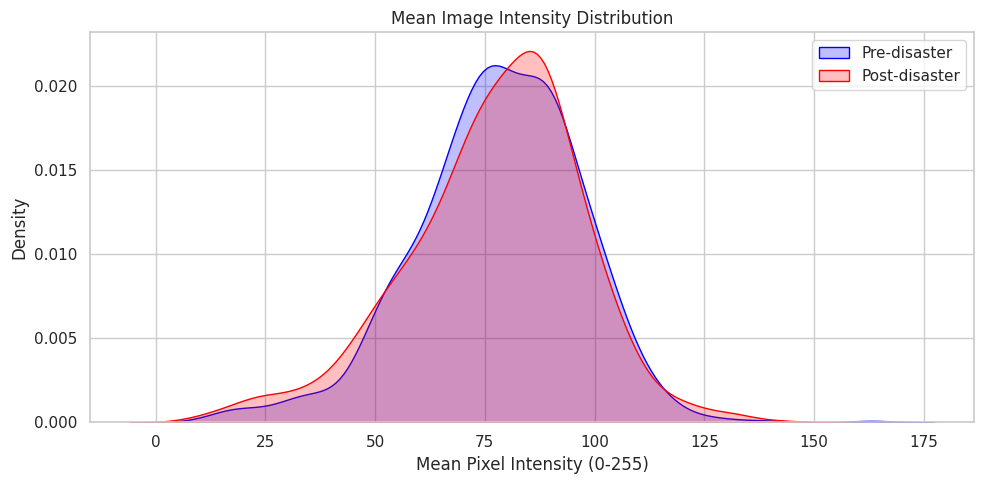

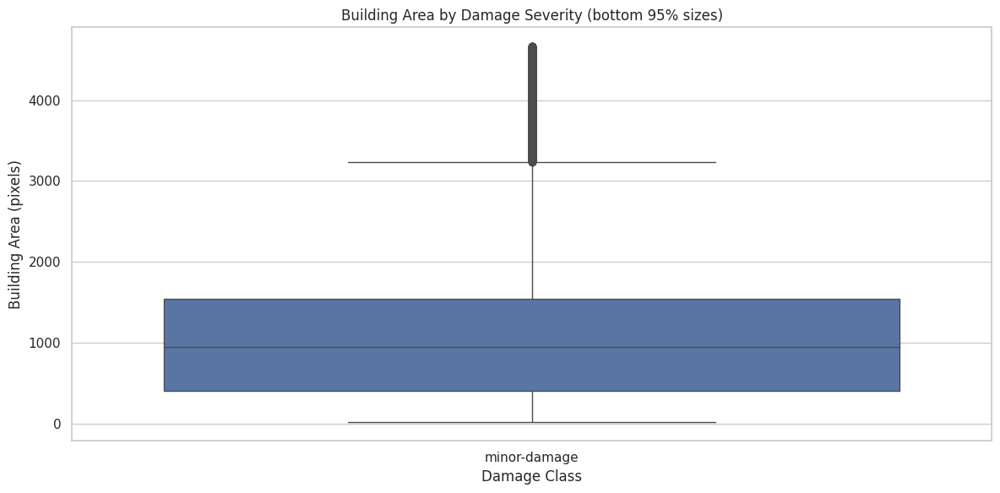

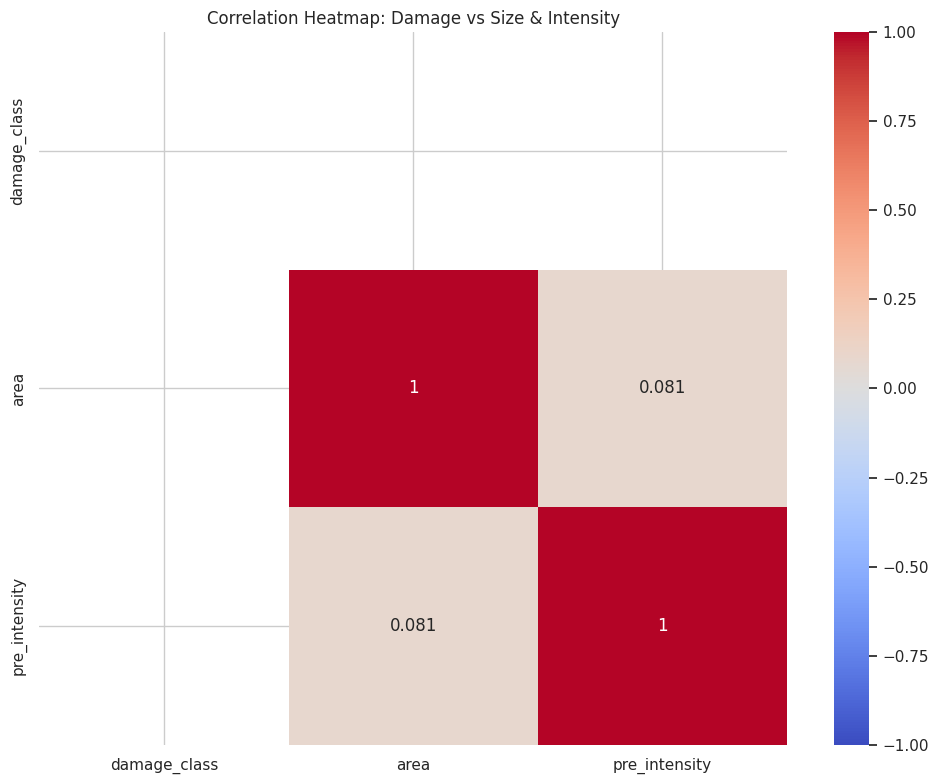

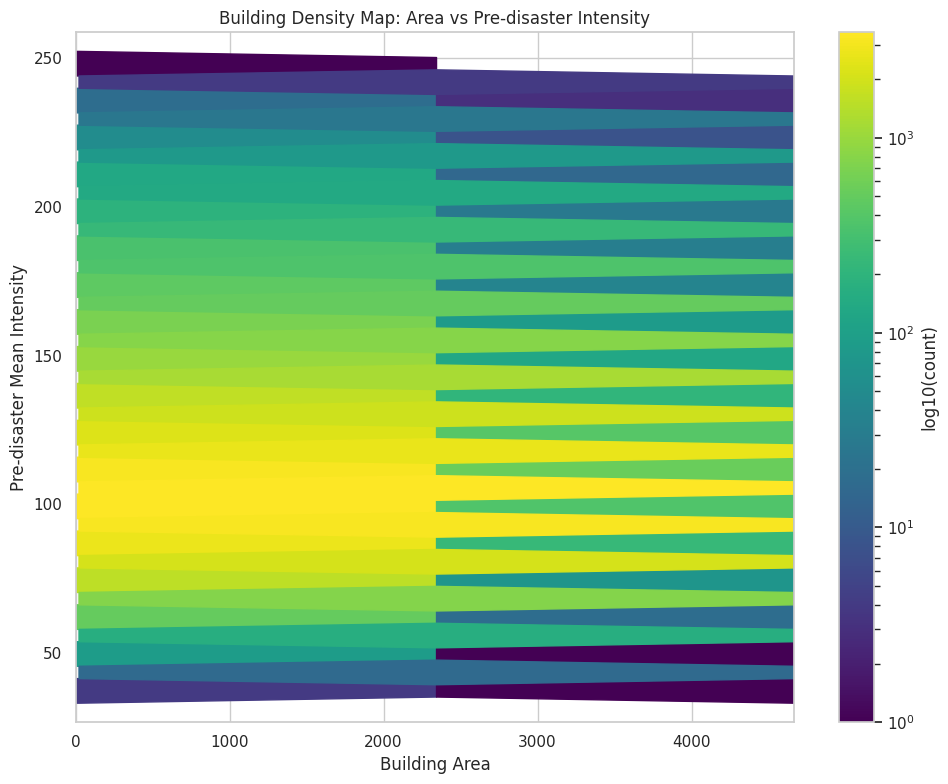

Saved all analysis plots and stats.


In [6]:
def plot_and_save_analysis():
    total_pixels = sum(mask_counts.values())
    if total_pixels == 0: total_pixels = 1
    mask_pct = {k: (v / total_pixels) * 100 for k, v in mask_counts.items()}
    
    plt.figure(figsize=(10, 5))
    sns.histplot(buildings_counts, bins=50, kde=True, color='teal')
    plt.title('Distribution of Buildings per Image')
    plt.xlabel('Number of Buildings')
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.savefig(PLOTS_DIR / 'buildings_per_image.png', dpi=300)
    plt.show()
    
    plt.figure(figsize=(10, 5))
    sns.kdeplot(intensities_pre, label='Pre-disaster', fill=True, color='blue')
    sns.kdeplot(intensities_post, label='Post-disaster', fill=True, color='red')
    plt.title('Mean Image Intensity Distribution')
    plt.xlabel('Mean Pixel Intensity (0-255)')
    plt.ylabel('Density')
    plt.legend()
    plt.tight_layout()
    plt.savefig(PLOTS_DIR / 'intensity_distribution.png', dpi=300)
    plt.show()
    
    if not df_metrics.empty:
        df_metrics['class_name'] = df_metrics['damage_class'].map(CLASS_MAPPING)
        plt.figure(figsize=(12, 6))
        sns.boxplot(x='class_name', y='area', data=df_metrics[df_metrics['area'] < np.percentile(df_metrics['area'], 95)])
        plt.title('Building Area by Damage Severity (bottom 95% sizes)')
        plt.xlabel('Damage Class')
        plt.ylabel('Building Area (pixels)')
        plt.tight_layout()
        plt.savefig(PLOTS_DIR / 'building_size_vs_damage.png', dpi=300)
        plt.show()
        
        plt.figure(figsize=(10, 8))
        corr_data = df_metrics[['damage_class', 'area', 'pre_intensity']].corr()
        sns.heatmap(corr_data, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
        plt.title('Correlation Heatmap: Damage vs Size & Intensity')
        plt.tight_layout()
        plt.savefig(PLOTS_DIR / 'correlation_heatmap.png', dpi=300)
        plt.show()
        
        plt.figure(figsize=(10, 8))
        plt.hexbin(df_metrics['area'], df_metrics['pre_intensity'], gridsize=30, cmap='viridis', bins='log')
        plt.colorbar(label='log10(count)')
        plt.title('Building Density Map: Area vs Pre-disaster Intensity')
        plt.xlabel('Building Area')
        plt.ylabel('Pre-disaster Mean Intensity')
        plt.xlim(0, np.percentile(df_metrics['area'], 95))
        plt.tight_layout()
        plt.savefig(PLOTS_DIR / 'density_map.png', dpi=300)
        plt.show()
        
    print("Saved all analysis plots and stats.")

plot_and_save_analysis()

## 7. Visualizing Random Samples


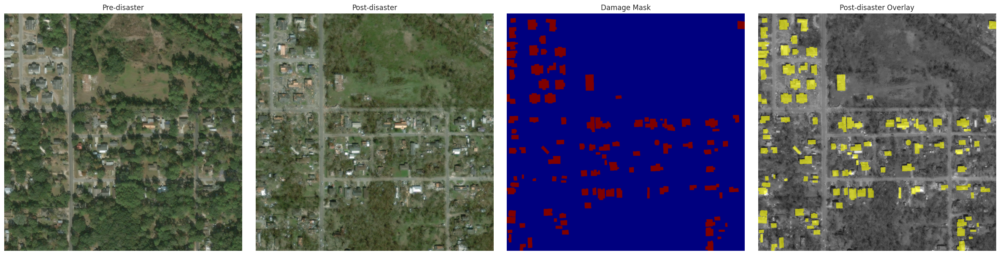

Saved visualization: hurricane-michael_00000307.png


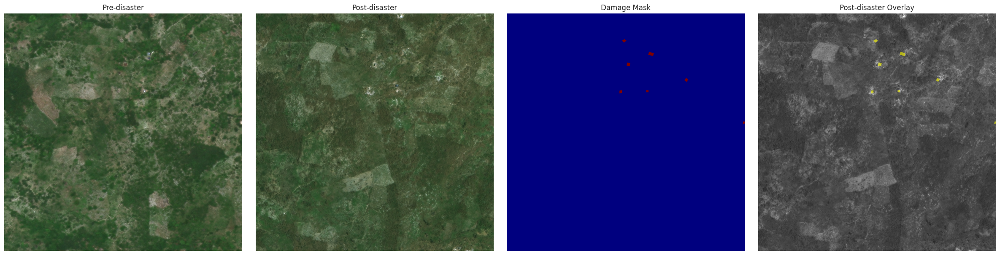

Saved visualization: hurricane-matthew_00000192.png


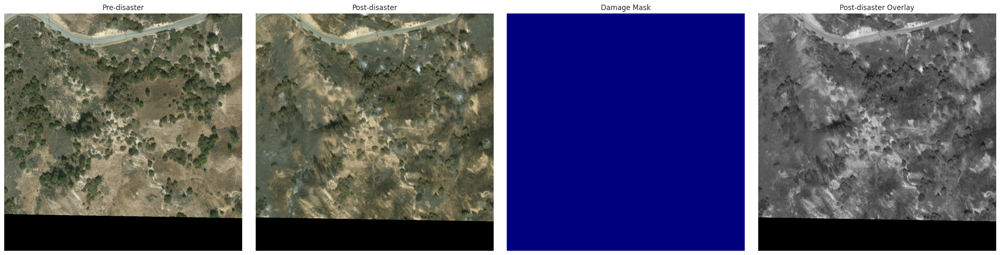

Saved visualization: socal-fire_00001115.png


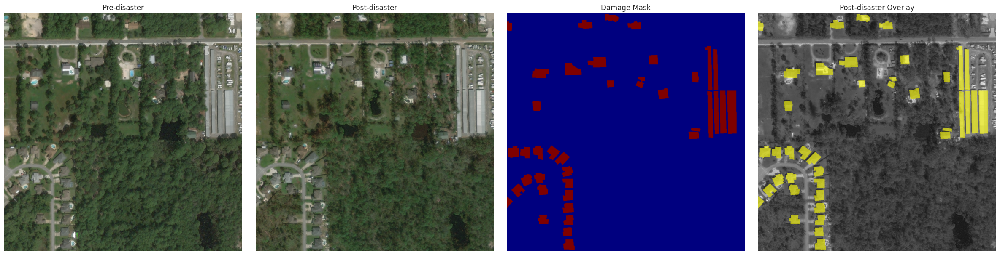

Saved visualization: hurricane-michael_00000485.png


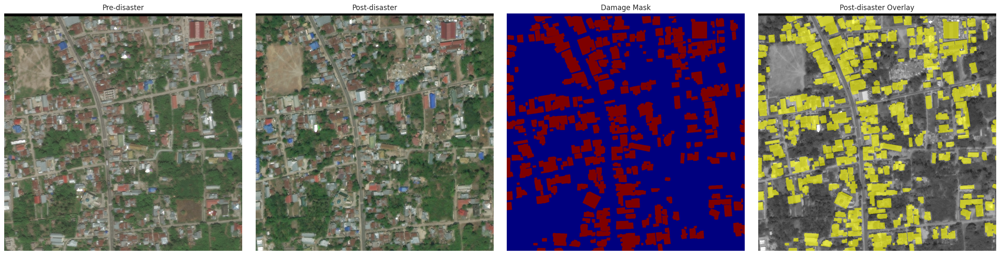

Saved visualization: palu-tsunami_00000024.png


In [7]:
def visualize_overlay(img, mask, num_classes=5):
    colors = np.array([
        [0, 255, 0],
        [255, 255, 0],
        [255, 165, 0],
        [255, 0, 0],
        [128, 128, 128]
    ], dtype=np.uint8)
    
    color_mask = colors[np.clip(mask, 0, num_classes-1)]
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    img_rgb = cv2.cvtColor(img_gray, cv2.COLOR_GRAY2RGB)
    
    overlay = img_rgb.copy()
    if np.any(mask > 0):
        valid_mask = mask > 0
        overlay[valid_mask] = cv2.addWeighted(img_rgb[valid_mask], 0.4, color_mask[valid_mask], 0.6, 0)
    
    return overlay

def generate_sample_visualizations(df: pd.DataFrame, n_samples: int = 5):
    samples = df.sample(n=n_samples, random_state=42)
    
    for idx, row in samples.iterrows():
        try:
            pre_img = np.array(Image.open(row['pre_path']))
            post_img = np.array(Image.open(row['post_path']))
            target = np.array(Image.open(row['target_path']))
            
            overlay_post = visualize_overlay(post_img, target)
            
            fig, axs = plt.subplots(1, 4, figsize=(24, 6))
            
            axs[0].imshow(pre_img)
            axs[0].set_title('Pre-disaster')
            axs[0].axis('off')
            
            axs[1].imshow(post_img)
            axs[1].set_title('Post-disaster')
            axs[1].axis('off')
            
            axs[2].imshow(target, cmap='jet')
            axs[2].set_title('Damage Mask')
            axs[2].axis('off')
            
            axs[3].imshow(overlay_post)
            axs[3].set_title('Post-disaster Overlay')
            axs[3].axis('off')
            
            plt.tight_layout()
            out_path = SAMPLES_DIR / f"{row['disaster_type']}_{row['sample_id']}.png"
            plt.savefig(out_path, dpi=150)
            plt.show()
            print(f"Saved visualization: {out_path.name}")
        except Exception as e:
            import traceback
            print(f"Failed to process sample {row['sample_id']}: {e}")
            traceback.print_exc()

generate_sample_visualizations(df_valid, n_samples=5)